In [261]:
# Py utils
from pathlib import Path

# Py data
import pandas as pd
import numpy as np
from scipy import stats

# Visualization
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
mpl.rc('figure', dpi=300, facecolor='white')

# Data set split
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit

# Data cleaning and transform
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer

# Model selection / Hyper-paramter tuning
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Models
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR

# Steps
* Data Loading
 * check data information and structure
 * Split data to training and test sets
* Exploratory Data Analysis - Discover and visualize data to get insights </br>
 Insights:
 * Added extra attributes more correlated with labels
* Data Processing - Prepare data for ML algorithms
 * Data cleaning - imputing
 * Categorical attributes encoding
 * Custom transformer to add extra attributes
 * Numerical attributes scaling (after imputing and adding extra attributes)
 * Build data processing pipeline
* Model Training and Selection - Hyperparameter Tuning

# 1. Data Loading
- Data Information and Structure
- Data Train/Test Split

In [9]:
HOUSING_DATA_PATH = "./datasets/housing"
HOUSING_DATA_FILE = "housing.csv"
housing_data = pd.read_csv(Path().joinpath(HOUSING_DATA_PATH, HOUSING_DATA_FILE))

In [10]:
housing_data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [11]:
housing_data.info()
housing_data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [13]:
housing_data["ocean_proximity"].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

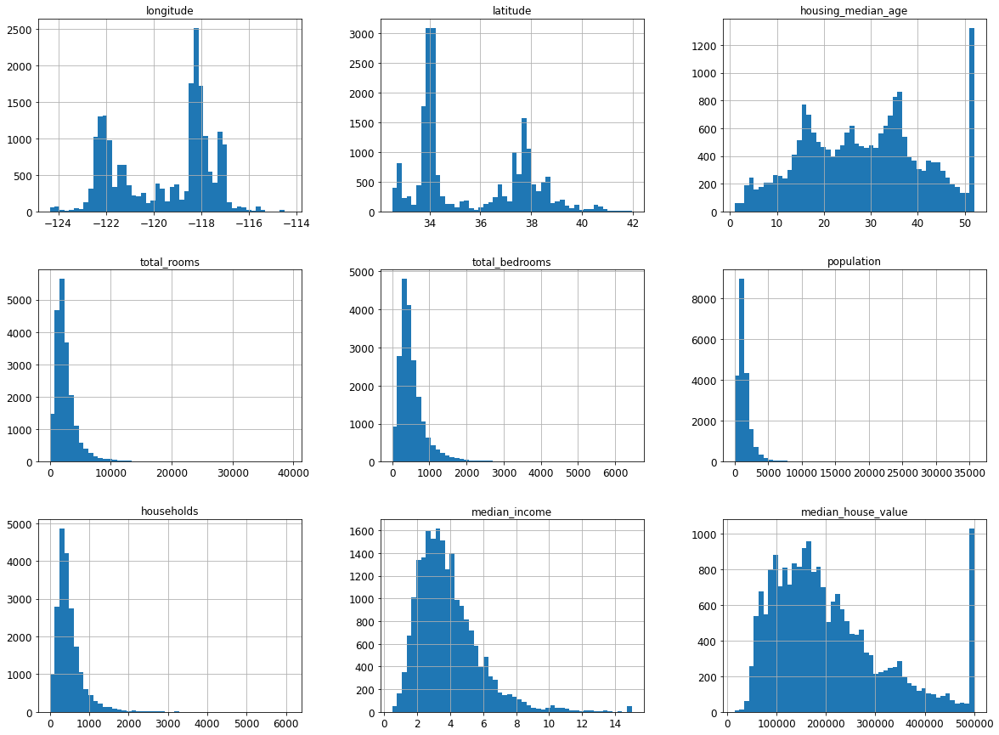

In [15]:
housing_data.hist(bins=50, figsize=(20, 15));

## Simple Train-Test Split

In [21]:
train_set, test_set = train_test_split(housing_data, test_size=0.2, random_state=42)

In [22]:
test_set.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20046,-119.01,36.06,25.0,1505.0,NaN,1392.0,359.0,1.6812,47700.0,INLAND
3024,-119.46,35.14,30.0,2943.0,NaN,1565.0,584.0,2.5313,45800.0,INLAND
15663,-122.44,37.80,52.0,3830.0,NaN,1310.0,963.0,3.4801,500001.0,NEAR BAY
20484,-118.72,34.28,17.0,3051.0,NaN,1705.0,495.0,5.7376,218600.0,<1H OCEAN
9814,-121.93,36.62,34.0,2351.0,NaN,1063.0,428.0,3.7250,278000.0,NEAR OCEAN


## Stratified Sampling for Train-Test Split
#### *Assumption*: median income is an important attribute to predict median house prices

* Cut median_income into strats

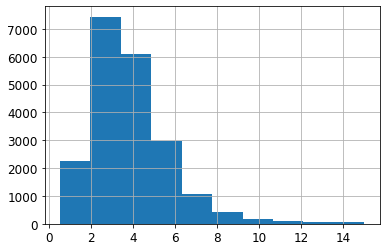

In [25]:
housing_data['median_income'].hist();

In [27]:
housing_data['income_cat'] = pd.cut(housing_data['median_income'],
                                   bins=[0., 1.5, 3., 4.5, 6., np.inf],
                                   labels=[1, 2, 3, 4, 5])

In [31]:
housing_data['income_cat'].value_counts()

3    7236
2    6581
4    3639
5    2362
1     822
Name: income_cat, dtype: int64

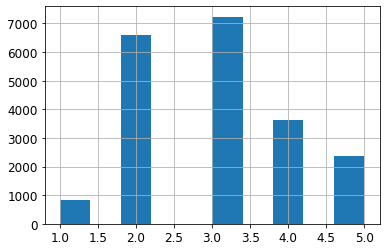

In [33]:
housing_data['income_cat'].hist();

* Stratified Shuffle Split

In [56]:
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
strat_train_index, strat_test_index = next(split.split(np.zeros(len(housing_data)), housing_data['income_cat']))
strat_train_set, strat_test_set = housing_data.loc[strat_train_index], housing_data.loc[strat_test_index]

In [57]:
strat_test_set['income_cat'].value_counts() / len(strat_test_set)

3    0.350533
2    0.318798
4    0.176357
5    0.114583
1    0.039729
Name: income_cat, dtype: float64

In [58]:
housing_data['income_cat'].value_counts() / len(housing_data)

3    0.350581
2    0.318847
4    0.176308
5    0.114438
1    0.039826
Name: income_cat, dtype: float64

* Compare proportions between StratifiedShuffleSplit and Uniformlly Random train_test_split

In [59]:
# Uniformlly random split with income_cat
train_set, test_set = train_test_split(housing_data, test_size=0.2, random_state=42)

In [60]:
# Compare
def income_cat_proportions(data):
    return data['income_cat'].value_counts() / len(data)

compare_props = pd.DataFrame({
    "Overall": income_cat_proportions(housing_data),
    "Uniform": income_cat_proportions(test_set),
    "Stratified": income_cat_proportions(strat_test_set),
}).sort_index()
compare_props["Uniform %error"] = 100 * abs(compare_props["Uniform"] / compare_props["Overall"] - 1)
compare_props["Stratified %error"] = 100 * abs(compare_props["Stratified"] / compare_props["Overall"] - 1)

In [61]:
compare_props

,Overall,Uniform,Stratified,Uniform %error,Stratified %error
1,0.039826,0.040213,0.039729,0.973236,0.243309
2,0.318847,0.324370,0.318798,1.732260,0.015195
3,0.350581,0.358527,0.350533,2.266446,0.013820
4,0.176308,0.167393,0.176357,5.056334,0.027480
5,0.114438,0.109496,0.114583,4.318374,0.127011


In [62]:
# Drop intermediate column incom_cat
strat_train_set.drop("income_cat", axis=1, inplace=True)
strat_test_set.drop("income_cat", axis=1, inplace=True)

# Exploratory Data Analysis
### Discover and visualize data to gain insights

In [63]:
housing = strat_train_set.copy()  # Prevent change training set during playing

* ### Plot geography distribution

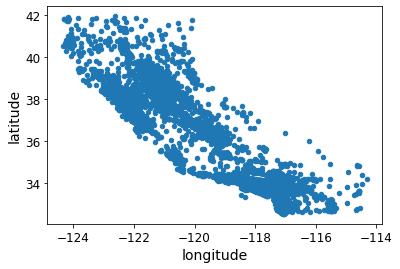

In [64]:
housing.plot(kind='scatter', x='longitude', y='latitude');

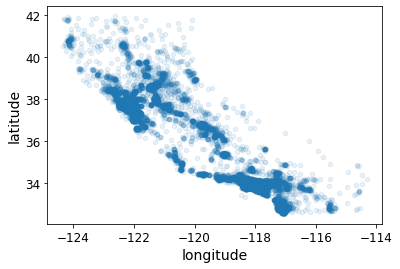

In [66]:
housing.plot(kind='scatter', x='longitude', y='latitude', alpha=0.1);

- ### Plot 1 feature on size, and Y label on color

In [67]:
housing['population']

17606     710.0
18632     306.0
14650     936.0
3230     1460.0
3555     4459.0
          ...  
6563      573.0
12053    1052.0
13908    2098.0
11159    1356.0
15775    1269.0
Name: population, Length: 16512, dtype: float64

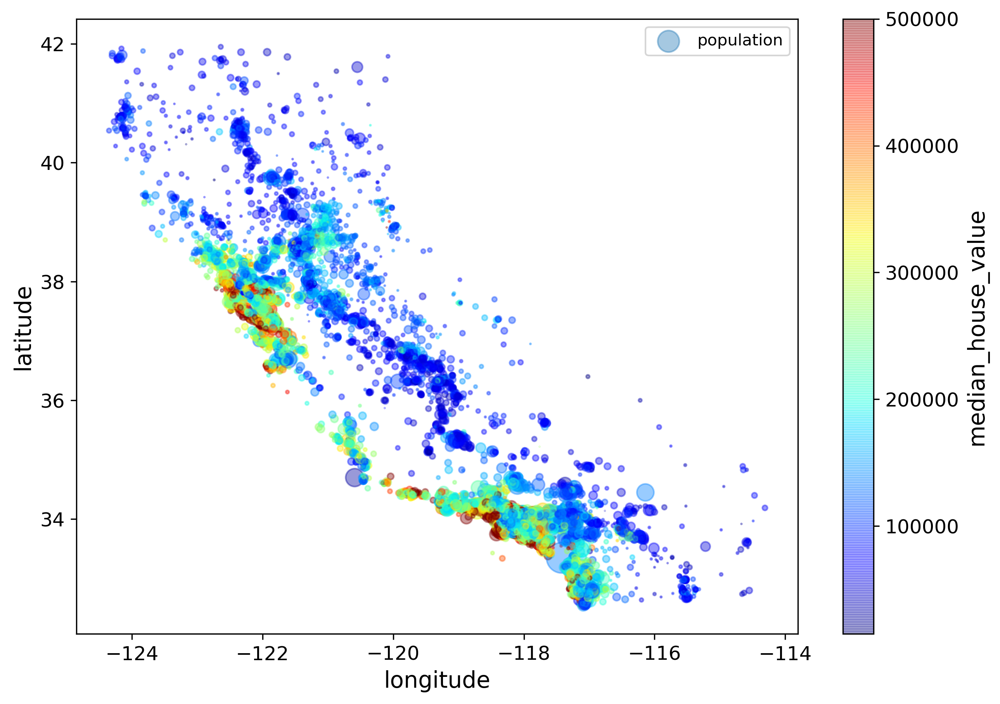

In [88]:
housing.plot(
    kind='scatter', x='longitude', y='latitude', alpha=0.4,
    figsize=(10,7),
    s=housing['population']/100, label='population',  # legend label         
    c='median_house_value', cmap=plt.get_cmap("jet"), colorbar=True,
    sharex=False  # fix bug that x-axis not displayed
);

- ### Correlation between features and labels

In [73]:
R = housing.corr()

In [74]:
R

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924478,-0.105848,0.048871,0.076598,0.108030,0.063070,-0.019583,-0.047432
latitude,-0.924478,1.000000,0.005766,-0.039184,-0.072419,-0.115222,-0.077647,-0.075205,-0.142724
housing_median_age,-0.105848,0.005766,1.000000,-0.364509,-0.325047,-0.298710,-0.306428,-0.111360,0.114110
total_rooms,0.048871,-0.039184,-0.364509,1.000000,0.929379,0.855109,0.918392,0.200087,0.135097
total_bedrooms,0.076598,-0.072419,-0.325047,0.929379,1.000000,0.876320,0.980170,-0.009740,0.047689
population,0.108030,-0.115222,-0.298710,0.855109,0.876320,1.000000,0.904637,0.002380,-0.026920
households,0.063070,-0.077647,-0.306428,0.918392,0.980170,0.904637,1.000000,0.010781,0.064506
median_income,-0.019583,-0.075205,-0.111360,0.200087,-0.009740,0.002380,0.010781,1.000000,0.687160
median_house_value,-0.047432,-0.142724,0.114110,0.135097,0.047689,-0.026920,0.064506,0.687160,1.000000


In [75]:
R['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.687160
total_rooms           0.135097
housing_median_age    0.114110
households            0.064506
total_bedrooms        0.047689
population           -0.026920
longitude            -0.047432
latitude             -0.142724
Name: median_house_value, dtype: float64

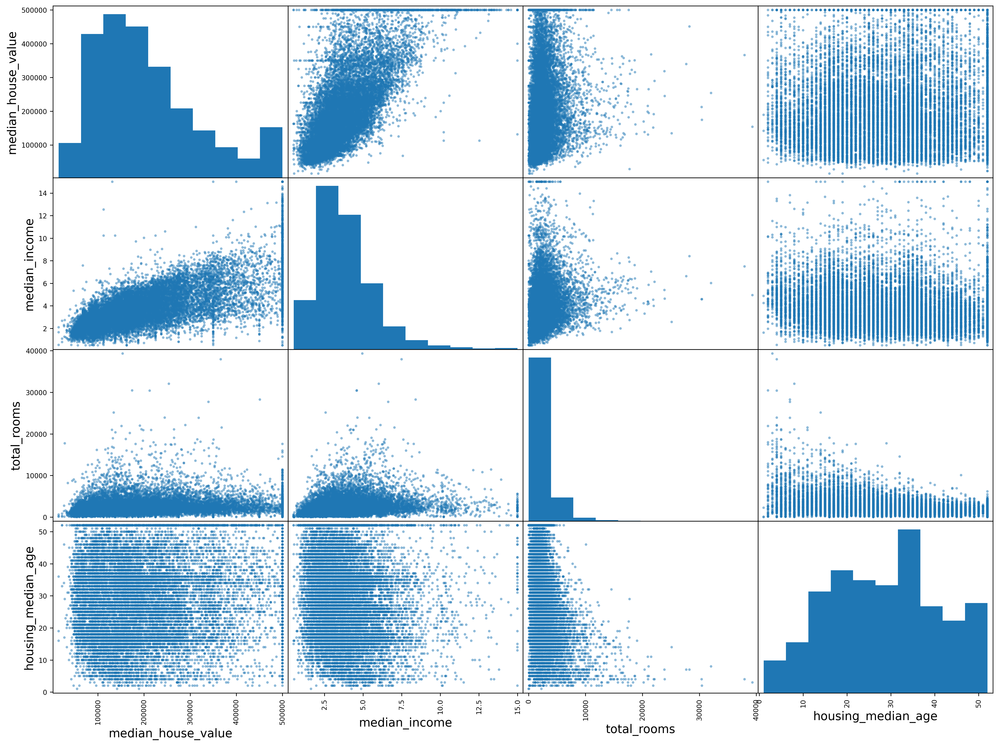

In [80]:
sel_attr = ['median_house_value', 'median_income', 'total_rooms', 'housing_median_age']
pd.plotting.scatter_matrix(housing[sel_attr], figsize=(20, 15));

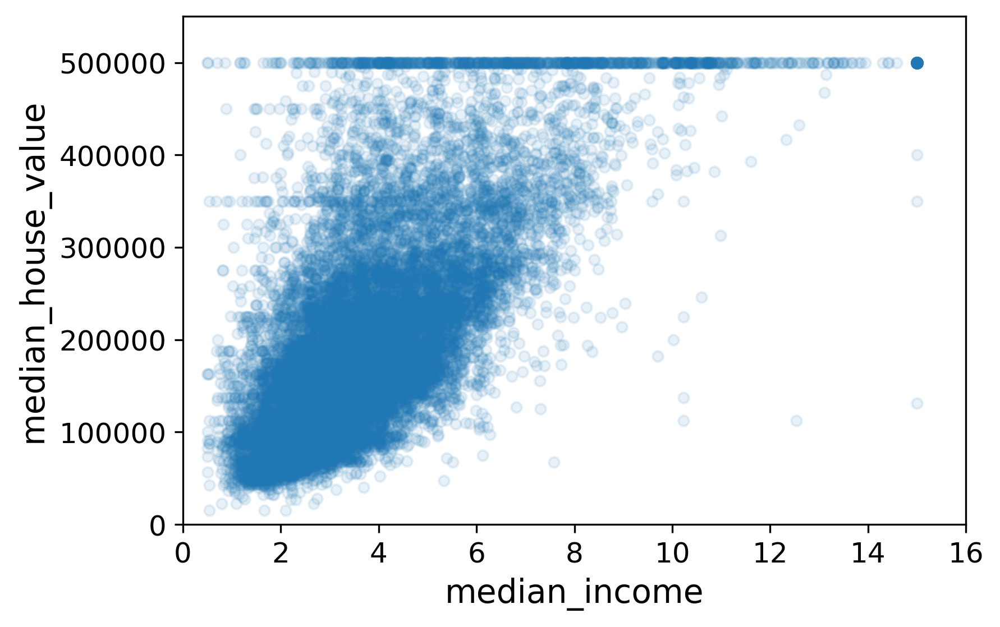

In [99]:
housing.plot(kind='scatter', x='median_income', y='median_house_value', alpha=0.1);
plt.axis([0, 16, 0, 550000]);

- ### Correlation between Y and added features

In [100]:
housing['rooms_per_household'] = housing['total_rooms'] / housing['households']
housing['bedrooms_per_room'] = housing['total_bedrooms'] / housing['total_rooms']
housing['population_per_household'] = housing['population'] / housing['households']

In [103]:
R = housing.corr()
R['median_house_value'].sort_values(ascending=False)

median_house_value          1.000000
median_income               0.687160
rooms_per_household         0.146285
total_rooms                 0.135097
housing_median_age          0.114110
households                  0.064506
total_bedrooms              0.047689
population_per_household   -0.021985
population                 -0.026920
longitude                  -0.047432
latitude                   -0.142724
bedrooms_per_room          -0.259984
Name: median_house_value, dtype: float64

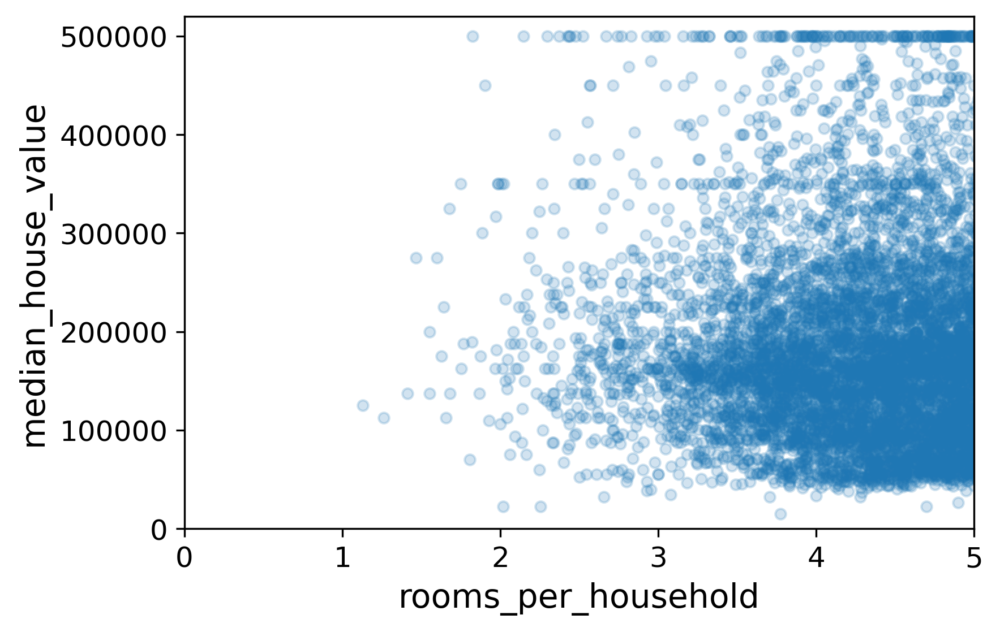

In [106]:
housing.plot(kind='scatter', x='rooms_per_household', y='median_house_value', alpha=0.2);
plt.axis([0, 5, 0, 520000]);

# Prepare data for ML algorithms

- ### Copy a clean training set
- ### Separate predictors and labels

In [107]:
X = strat_train_set.drop('median_house_value', axis=1)  # drop() creates a new copy
y = strat_train_set['median_house_value'].copy()

- ### Data Cleaning - Impute numeric attributes with median

In [113]:
# Check if any NaN exists
X[X.isnull().any(axis=1)].sort_index()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,NEAR BAY
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,NEAR BAY
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,NEAR BAY
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,NEAR BAY
738,-122.14,37.67,37.0,3342.0,NaN,1635.0,557.0,4.7933,NEAR BAY
...,...,...,...,...,...,...,...,...,...
20125,-118.80,34.41,45.0,1610.0,NaN,1148.0,347.0,2.7000,<1H OCEAN
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,NEAR OCEAN
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,NEAR OCEAN
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,<1H OCEAN


In [122]:
# Fit and transform the imputer
X_num = X.select_dtypes(include=[np.number])
imputer = SimpleImputer(strategy='median')
X_num = pd.DataFrame(
    imputer.fit_transform(X_num),
    columns=X_num.columns, index=X_num.index)
imputer.statistics_  # Same as computing the median of each attribute

array([-118.51  ,   34.26  ,   29.    , 2119.5   ,  433.    , 1164.    ,
        408.    ,    3.5409])

In [123]:
X_num[X_num.isnull().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income


- ### Transform Categorical Data

In [127]:
X_cat = X[['ocean_proximity']]

In [128]:
X_cat

,ocean_proximity
17606,<1H OCEAN
18632,<1H OCEAN
14650,NEAR OCEAN
3230,INLAND
3555,<1H OCEAN
...,...
6563,INLAND
12053,INLAND
13908,INLAND
11159,<1H OCEAN


#### Ordinal Encoder. Not good for non-ordinal data.

In [131]:
ordinal_encoder = OrdinalEncoder()
X_cat_ordenc = ordinal_encoder.fit_transform(X_cat)
X_cat_ordenc[:10]

array([[0.],
       [0.],
       [4.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.]])

In [130]:
ordinal_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

#### One HOT Encoder

In [132]:
onehot_encoder = OneHotEncoder()
X_cat_1hot = onehot_encoder.fit_transform(X_cat)
X_cat_1hot

<16512x5 sparse matrix of type '<class 'numpy.float64'>'
	with 16512 stored elements in Compressed Sparse Row format>

In [134]:
X_cat_1hot.toarray()  # or use OneHotEncoder(sparse=False)

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       ...,
       [0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0.]])

In [135]:
onehot_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

- ### Custom Transformer to Add Extra Attributes

In [155]:
rooms_ix, bedrooms_ix, population_ix, households_ix = [
    X.columns.get_loc(c) for c in ("total_rooms", "total_bedrooms", "population", "households")
]

class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
    def __init__(self, add_bedrooms_per_room=True):  # no *args or **kwargs
        self.add_bedrooms_per_room = add_bedrooms_per_room
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            X = X.values
        rooms_per_household = X[:, rooms_ix] / X[:, households_ix]
        population_per_household = X[:, population_ix] / X[:, households_ix]
        if self.add_bedrooms_per_room:
            bedrooms_per_room = X[:, bedrooms_ix] / X[:, rooms_ix]
            return np.c_[X, rooms_per_household, population_per_household, bedrooms_per_room]
        else:
            return np.c_[X, rooms_per_household, population_per_household]
        
attr_adder = CombinedAttributesAdder(add_bedrooms_per_room=False)
extra_attr_names = ["rooms_per_household", "population_per_household"]

In [147]:
X_extra_attribs = pd.DataFrame(
    attr_adder.transform(X),
    columns=list(X.columns)+extra_attr_names,
    index=X.index)
X_extra_attribs.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,rooms_per_household,population_per_household
17606,-121.89,37.29,38,1568,351,710,339,2.7042,<1H OCEAN,4.62537,2.0944
18632,-121.93,37.05,14,679,108,306,113,6.4214,<1H OCEAN,6.00885,2.70796
14650,-117.2,32.77,31,1952,471,936,462,2.8621,NEAR OCEAN,4.22511,2.02597
3230,-119.61,36.31,25,1847,371,1460,353,1.8839,INLAND,5.23229,4.13598
3555,-118.59,34.23,17,6592,1525,4459,1463,3.0347,<1H OCEAN,4.50581,3.04785


- ### Build Data Processing Pipeline

In [157]:
# Numerical attributes pipeline
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('attribs_adder', CombinedAttributesAdder()),
    ('std_scaler', StandardScaler()),
])

In [158]:
# Combine numerical pipeline and categorical encoder
num_attribs = X_num.columns.tolist()
cat_attribs = ["ocean_proximity"]

full_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_attribs),
    ('cat', OneHotEncoder(), cat_attribs),
])

In [160]:
# fit_transform, ..., transform
X_prepared = full_pipeline.fit_transform(X)
print(X_prepared.shape)
X_prepared

(16512, 16)


array([[-1.15604281,  0.77194962,  0.74333089, ...,  0.        ,
         0.        ,  0.        ],
       [-1.17602483,  0.6596948 , -1.1653172 , ...,  0.        ,
         0.        ,  0.        ],
       [ 1.18684903, -1.34218285,  0.18664186, ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [ 1.58648943, -0.72478134, -1.56295222, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.78221312, -0.85106801,  0.18664186, ...,  0.        ,
         0.        ,  0.        ],
       [-1.43579109,  0.99645926,  1.85670895, ...,  0.        ,
         1.        ,  0.        ]])

# 
# Model Training and Selection - Hyperparameter tuning

* ### Initial Model Selection

In [184]:
lin_reg = LinearRegression()
tree_reg = DecisionTreeRegressor(random_state=42)
forest_reg = RandomForestRegressor(n_estimators=100, random_state=42)
svm_lin_reg = SVR(kernel="linear")
svm_rbf_reg = SVR(kernel='rbf')
gb_reg = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
models  = {
    "Linear": lin_reg,
    "Decision Tree": tree_reg,
    "Random Forest": forest_reg,
    "SVM Linear": svm_lin_reg,
    "SVM RBF": svm_rbf_reg,
    "Gradient Boosting": gb_reg,
}

In [185]:
rmse = {}
for mdl_name, mdl in models.items():
    scores = cross_val_score(mdl, X_prepared, y, scoring="neg_mean_squared_error", cv=10)
    rmse[mdl_name] = np.sqrt(-scores)

In [187]:
rmse_df = pd.DataFrame(rmse)
display(rmse_df)
display(rmse_df.agg(['mean', 'std'], axis=0))

,Linear,Decision Tree,Random Forest,SVM Linear,SVM RBF,Gradient Boosting
0,66782.738440,70194.336808,49519.803642,105342.091420,111389.068190,51453.578076
1,66960.118071,66855.163639,47461.911582,112489.246241,119541.259386,50054.391567
2,70347.952444,72432.582448,50029.027629,110092.350428,116957.628304,53041.453993
3,74739.570526,70758.738968,52325.280690,113403.228925,120447.199325,55597.602384
4,68031.133889,71115.882306,49308.394264,110638.901197,117618.159042,53109.892085
5,71193.841834,75585.141729,53446.378926,115675.832002,122309.103515,56122.891881
6,64969.630564,70262.861391,48634.803657,110703.568872,117634.402307,50679.939787
7,68281.611380,70273.632528,47585.738323,114476.890082,121469.713921,51091.302598
8,71552.915666,75366.879526,53490.106998,113756.179712,120343.013696,56606.583218
9,67665.100821,71231.657260,50021.585292,111520.112081,118017.128607,53909.004944


,Linear,Decision Tree,Random Forest,SVM Linear,SVM RBF,Gradient Boosting
mean,69052.461363,71407.687660,50182.303100,111809.840096,118572.667629,53166.664053
std,2879.437224,2571.389745,2210.517524,2911.818591,3095.740794,2360.875190


* ### Hyperparameter Tuning - Grid Search

In [189]:
# Grid Search
param_grid = [
    {'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
]
grid_search = GridSearchCV(forest_reg, param_grid, cv=5, scoring='neg_mean_squared_error',
                           return_train_score=True, n_jobs=6)
grid_search.fit(X_prepared, y)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
             param_grid=[{'max_features': [2, 4, 6, 8],
                          'n_estimators': [3, 10, 30]},
                         {'bootstrap': [False], 'max_features': [2, 3, 4],
                          'n_estimators': [3, 10]}],
             return_train_score=True, scoring='neg_mean_squared_error')

In [190]:
print("Best Params: ", grid_search.best_params_)
print("Best Estimator: ", grid_search.best_estimator_)

Best Params:  {'max_features': 8, 'n_estimators': 30}
Best Estimator:  RandomForestRegressor(max_features=8, n_estimators=30, random_state=42)


In [191]:
grid_search.cv_results_

{'mean_fit_time': array([0.04002962, 0.11751533, 0.35160007, 0.06002746, 0.19665022,
        0.58545871, 0.08138251, 0.27313805, 0.82960224, 0.10471616,
        0.35171142, 1.06153617, 0.05606251, 0.18521781, 0.07555265,
        0.24763699, 0.09401174, 0.31068997]),
 'std_fit_time': array([0.00158984, 0.00194309, 0.00173094, 0.00084188, 0.00139839,
        0.00183176, 0.00224282, 0.00342763, 0.01208082, 0.00089182,
        0.00241467, 0.00682557, 0.00100697, 0.00120342, 0.0017445 ,
        0.00272436, 0.00147802, 0.0010715 ]),
 'mean_score_time': array([0.00235085, 0.005759  , 0.01663756, 0.00196428, 0.00583215,
        0.01664081, 0.00190806, 0.00596662, 0.01700315, 0.00198789,
        0.00591946, 0.01682653, 0.0022202 , 0.00687094, 0.0022438 ,
        0.006879  , 0.00222344, 0.00685477]),
 'std_score_time': array([6.38188064e-05, 1.03014375e-04, 3.65442100e-05, 1.06780163e-04,
        2.59923931e-05, 2.14113159e-05, 7.95352373e-05, 2.45434686e-04,
        5.30080753e-04, 7.85073537e-

In [215]:
print("Grid Search Mean RMSE of Training and Test:")
gsres = grid_search.cv_results_
gsres_df = pd.DataFrame({
    k.replace('score', 'rmse').replace('param_', ''): 
    np.sqrt(-gsres[k]) if 'score' in k else gsres[k]
    for k in ("param_bootstrap", "param_max_features", "param_n_estimators",
              "mean_train_score", "mean_test_score")
})
gsres_df.sort_values('mean_test_rmse')

Grid Search Mean RMSE of Training and Test:


,bootstrap,max_features,n_estimators,mean_train_rmse,mean_test_rmse
11,NaN,8,30,19520.067242,49682.273345
8,NaN,6,30,19599.223765,50146.511674
5,NaN,4,30,19695.911545,50377.404617
17,False,4,10,0.055029,51009.495669
10,NaN,8,10,22189.887438,51711.127884
7,NaN,6,10,22390.508914,52006.198735
15,False,3,10,2.296101,52724.982259
4,NaN,4,10,22724.135843,52741.047043
2,NaN,2,30,20963.621373,53384.572751
13,False,2,10,0.778205,54658.176158


#### Feature importances

In [222]:
feature_importances = grid_search.best_estimator_.feature_importances_
feature_importances

array([7.33442355e-02, 6.29090705e-02, 4.11437985e-02, 1.46726854e-02,
       1.41064835e-02, 1.48742809e-02, 1.42575993e-02, 3.66158981e-01,
       5.64191792e-02, 1.08792957e-01, 5.33510773e-02, 1.03114883e-02,
       1.64780994e-01, 6.02803867e-05, 1.96041560e-03, 2.85647464e-03])

In [226]:
extra_attribs = ['rooms_per_hhold', 'pop_per_hhold', 'bedrooms_per_room']
cat_encoder = full_pipeline.named_transformers_['cat']
cat_one_hot_attribs = list(cat_encoder.categories_[0])
attributes = num_attribs + extra_attribs + cat_one_hot_attribs
sorted(zip(feature_importances, attributes), reverse=True)

[(0.36615898061813423, 'median_income'),
 (0.16478099356159054, 'INLAND'),
 (0.10879295677551575, 'pop_per_hhold'),
 (0.07334423551601243, 'longitude'),
 (0.06290907048262032, 'latitude'),
 (0.056419179181954014, 'rooms_per_hhold'),
 (0.053351077347675815, 'bedrooms_per_room'),
 (0.04114379847872964, 'housing_median_age'),
 (0.014874280890402769, 'population'),
 (0.014672685420543239, 'total_rooms'),
 (0.014257599323407808, 'households'),
 (0.014106483453584104, 'total_bedrooms'),
 (0.010311488326303788, '<1H OCEAN'),
 (0.0028564746373201584, 'NEAR OCEAN'),
 (0.0019604155994780706, 'NEAR BAY'),
 (6.0280386727366e-05, 'ISLAND')]

#### Final model - evalualte generalization error on test set

In [237]:
X_test = strat_test_set.drop("median_house_value", axis=1)
y_test = strat_test_set["median_house_value"].copy()

X_test_prepared = full_pipeline.transform(X_test)
gs_final_model = grid_search.best_estimator_
y_pred = gs_final_model.predict(X_test_prepared)

test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
test_rmse

47730.22690385927

In [241]:
confidence_level = 0.95
rss = (y_pred - y_test) ** 2
mse_conf_interval = stats.t.interval(
    alpha=confidence_level,
    df=len(rss)-1,  # df > 30, same as Z-score
    loc=rss.mean(),
    scale=stats.sem(rss)
)
print("Test RMSE 95% confidence inverval: ", np.sqrt(mse_conf_interval))

Test RMSE 95% confidence inverval:  [45685.10470776 49691.25001878]


* ### Hyperparameter Tuning - Randomized Search

In [217]:
param_distribs = {
    'n_estimators': stats.randint(low=1, high=200),
    'max_features': stats.randint(low=1, high=8),
}
rand_search = RandomizedSearchCV(forest_reg, param_distributions=param_distribs, n_iter=10, cv=5,
                                scoring='neg_mean_squared_error', random_state=42, n_jobs=6)
rand_search.fit(X_prepared, y)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   param_distributions={'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f607a2c8040>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f6078400e80>},
                   random_state=42, scoring='neg_mean_squared_error')

In [221]:
print("Randomized Search Mean Test RMSE:")
rsres = rand_search.cv_results_
rsres_df = pd.DataFrame({
    k.replace('score', 'rmse').replace('param_', ''): 
    np.sqrt(-rsres[k]) if 'score' in k else rsres[k]
    for k in ("param_max_features", "param_n_estimators", "mean_test_score")
})
rsres_df.sort_values('mean_test_rmse')

Randomized Search Mean Test RMSE:


,max_features,n_estimators,mean_test_rmse
0,7,180,49150.707569
4,7,122,49280.944983
7,5,100,49608.996081
8,3,150,50473.619304
6,3,88,50682.788882
5,3,75,50774.906624
2,3,72,50796.155224
3,5,21,50835.133603
1,5,15,51389.889203
9,5,2,64429.841433


In [228]:
sorted(zip(rand_search.best_estimator_.feature_importances_, attributes), reverse=True)

[(0.3451784043801197, 'median_income'),
 (0.1605632289158767, 'INLAND'),
 (0.10846844860879654, 'pop_per_hhold'),
 (0.07246990515559049, 'longitude'),
 (0.07059074984842853, 'bedrooms_per_room'),
 (0.06380803224443841, 'latitude'),
 (0.057444535971841064, 'rooms_per_hhold'),
 (0.04275043945662488, 'housing_median_age'),
 (0.01653438073955306, 'total_rooms'),
 (0.016092910597195798, 'population'),
 (0.015610076150868492, 'total_bedrooms'),
 (0.015214959838627942, 'households'),
 (0.008774413032023276, '<1H OCEAN'),
 (0.003348861998751043, 'NEAR OCEAN'),
 (0.0030896126618977565, 'NEAR BAY'),
 (6.104039936629334e-05, 'ISLAND')]

In [242]:
rs_final_model = rand_search.best_estimator_
y_pred = rs_final_model.predict(X_test_prepared)
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
test_rmse

46910.92117024934

In [243]:
confidence_level = 0.95
rss = (y_pred - y_test) ** 2
mse_conf_interval = stats.t.interval(
    alpha=confidence_level,
    df=len(rss)-1,
    loc=rss.mean(),
    scale=stats.sem(rss)
)
print("Test RMSE 95% confidence inverval: ", np.sqrt(mse_conf_interval))

Test RMSE 95% confidence inverval:  [44945.41068188 48797.32686039]


# 
# Exercises

## 1.
Search C and gamma for SVR with GridSearchCV.

In [249]:
param_grid = [
    {'kernel': ['linear'], 'C': [10, 30, 100, 300, 1000, 3000, 10000, 30000, 60000, 90000, 120000]},
    {'kernel': ['rbf'], 'C': [1, 3, 10, 30, 100, 300, 1000], 'gamma': [0.01, 0.03, 0.1, 0.3, 1.0, 3.0]},
]
svm_reg = SVR()
grid_search = GridSearchCV(svm_reg, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=6)
grid_search.fit(X_prepared, y)

Fitting 5 folds for each of 53 candidates, totalling 265 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:   28.9s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:  3.5min
[Parallel(n_jobs=6)]: Done 265 out of 265 | elapsed:  5.6min finished


GridSearchCV(cv=5, estimator=SVR(), n_jobs=6,
             param_grid=[{'C': [10, 30, 100, 300, 1000, 3000, 10000, 30000,
                                60000, 90000, 120000],
                          'kernel': ['linear']},
                         {'C': [1, 3, 10, 30, 100, 300, 1000],
                          'gamma': [0.01, 0.03, 0.1, 0.3, 1.0, 3.0],
                          'kernel': ['rbf']}],
             scoring='neg_mean_squared_error', verbose=2)

In [250]:
print("Best RMSE:", np.sqrt(-grid_search.best_score_))
print("Best Params:", grid_search.best_params_)

Best RMSE: 70352.24018667937
Best Params: {'C': 120000, 'kernel': 'linear'}


## 2.
Repeat with RandomizedSearchCV

In [252]:
param_distribs = {
    'kernel': ['linear', 'rbf'],
    'C': stats.loguniform(20, 200000),
    'gamma': stats.expon(scale=1.0),
}
svm_reg = SVR()
rand_search = RandomizedSearchCV(svm_reg, param_distributions=param_distribs,
                                n_iter=50, cv=5, scoring='neg_mean_squared_error',
                                verbose=2, random_state=42, n_jobs=6)
rand_search.fit(X_prepared, y)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:   36.6s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:  4.5min
[Parallel(n_jobs=6)]: Done 250 out of 250 | elapsed:  7.5min finished


RandomizedSearchCV(cv=5, estimator=SVR(), n_iter=50, n_jobs=6,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f607a5e6c40>,
                                        'gamma': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f607a2cd3d0>,
                                        'kernel': ['linear', 'rbf']},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [253]:
print("Best RMSE:", np.sqrt(-rand_search.best_score_))
print("Best Params:", rand_search.best_params_)

Best RMSE: 54767.960710084146
Best Params: {'C': 157055.10989448498, 'gamma': 0.26497040005002437, 'kernel': 'rbf'}


## 3.
Add a transformer in the preparation pipeline to select only the most important attributes.

In [258]:
class TopFeatureSelector(BaseEstimator, TransformerMixin):
    """
    Select top K features based on feature_importances_ from CV search.
    """
    def __init__(self, feature_importances, k):
        self.feature_importances = feature_importances
        self.k = k
        
    @staticmethod
    def _indices_of_top_k(arr, k):
        return np.sort(np.argpartition(np.array(arr), -k)[-k:])
        
    def fit(self, X, y=None):
        self.feature_indices_ = self._indices_of_top_k(self.feature_importances, self.k)
        return self
    
    def transform(self, X):
        return X[:, self.feature_indices_]

In [259]:
k = 5
prepare_feature_select_pipeline = Pipeline([
    ('preparation', full_pipeline),
    ('feature_selection', TopFeatureSelector(feature_importances, k))
])
X_prepared_topk = prepare_feature_select_pipeline.fit_transform(X)

## 4.
Create full preparation + prediction pipeline.

In [269]:
k = 5
prepare_select_predict_pipeline = Pipeline([
    ('preparation', full_pipeline),
    ('feature_selection', TopFeatureSelector(feature_importances, k)),
    ('svm_reg', SVR(**rand_search.best_params_))
])
prepare_select_predict_pipeline.fit(X, y)

Pipeline(steps=[('preparation',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('attribs_adder',
                                                                   CombinedAttributesAdder()),
                                                                  ('std_scaler',
                                                                   StandardScaler())]),
                                                  ['longitude', 'latitude',
                                                   'housing_median_age',
                                                   'total_rooms',
                                                   'total_bedrooms',
                                                   'population', 'households',
                    

In [268]:
some_X, some_y = X.iloc[:4], y.iloc[:4]
some_y_pred = prepare_select_predict_pipeline.predict(some_X)
np.sqrt(mean_squared_error(some_y_pred, some_y))

46064.53897407655

## 5.
Automatically search pipeline parameters.

In [271]:
# Use double underscore __ to access parameters of nested pipeline stages.
param_grid = [{
    'preparation__num__imputer__strategy': ['mean', 'median', 'most_frequent'],
    'feature_selection__k': list(range(1, len(feature_importances)+1))
}]
grid_search_prep = GridSearchCV(prepare_select_predict_pipeline, param_grid, cv=5,
                               scoring='neg_mean_squared_error', verbose=2, n_jobs=6)
grid_search_prep.fit(X, y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:   21.7s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:  2.9min
[Parallel(n_jobs=6)]: Done 240 out of 240 | elapsed:  7.1min finished


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preparation',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('attribs_adder',
                                                                                          CombinedAttributesAdder()),
                                                                                         ('std_scaler',
                                                                                          StandardScaler())]),
                                                                         ['longitude',
                                                                          'latitude',
       

In [272]:
grid_search_prep.best_params_

{'feature_selection__k': 15,
 'preparation__num__imputer__strategy': 'most_frequent'}

In [273]:
y_pred = grid_search_prep.predict(X_test)
np.sqrt(mean_squared_error(y_pred, y_test))

52633.20037601686